## Image classification with Convolutional Neural Networks

## Colab Setup

In [2]:
!uptime

 07:14:16 up 26 min,  0 users,  load average: 0.70, 0.51, 0.46


In [2]:
!pwd

/content


In [37]:
cd /content

/content


In [16]:
cd /content/data/old_polish_cars

/content/data/old_polish_cars


In [3]:
!ls -lah /content/data/old_polish_cars

total 2.4G
drwxr-xr-x 3 root      root      4.0K Apr 11 13:21 .
drwxr-xr-x 3 root      root      4.0K Apr 11 13:20 ..
drwxr-xr-x 4 349452163 349400513 4.0K Apr  9 21:23 old_polish_cars_v5_photos-split
-rw-r--r-- 1 root      root      2.4G Apr 11 13:20 old_polish_cars_v5_photos-split-2017-11-15.tgz


## memory usage

In [2]:
!/opt/bin/nvidia-smi

Wed Apr 11 13:38:32 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 384.111                Driver Version: 384.111                   |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P8    30W / 149W |      0MiB / 11439MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [11]:
!top -n 1

=top - 14:02:26 up 14 min,  0 users,  load average: 0.69, 0.85, 0.64
Tasks:  10 total,   2 running,   8 sleeping,   0 stopped,   0 zombie
%Cpu(s): 29.9 us,  8.5 sy,  0.0 ni, 57.2 id,  4.1 wa,  0.0 hi,  0.4 si,  0.0 st
KiB Mem : 13341832 total,   164456 free,  5470720 used,  7706656 buff/cache
KiB Swap:        0 total,        0 free,        0 used.  7391852 avail Mem 

  PID USER      PR  NI    VIRT    RES    SHR S  %CPU %MEM     TIME+ COMMAND     
  112 root      20   0 6714104 4.903g  90000 R 100.0 38.5   0:40.60 python3     
    1 root      20   0   39144   6580   5204 S   0.0  0.0   0:00.09 run.sh      
   71 root      20   0  677272  38956  21704 S   0.0  0.3   0:01.02 node        
   81 root      20   0  712716  64436  22972 S   0.0  0.5   0:04.87 node        
   91 root      20   0  182660  57916  12376 S   0.0  0.4   0:03.07 jupyter-no+ 
  752 root      20   0  127780   6512   4304 S   0.0  0.0   0:00.01 dirmngr     
 1179 root      20   0  153376  10324   4056 S   0.0  0.1   0

In [5]:
import os
import psutil

def print_memsize():
  process = psutil.Process(os.getpid())
  print(f'{process.memory_info().rss / 1024**3:.5} GB')
  
print_memsize()

0.12209 GB


In [26]:
print_memsize()

3.2389 GB


## My dataset: 'Old Polish Cars'

In [0]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
# %matplotlib inline  # don't use in google colab
%config InlineBackend.figure_format = 'retina'

In [0]:
import warnings
warnings.filterwarnings('ignore')
from pathlib import Path
import shutil as sh

In [0]:
# This file contains all the main external libs we'll use
from fastai.imports import *

In [0]:
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

In [0]:
# PATH = "data/old_polish_cars/old_polish_cars_v5_photos/"
PATH = "data/old_polish_cars/old_polish_cars_v5_photos-split/"

In [0]:
sz=224
# sz=128

## Easy steps to train a world-class image classifier

1. Enable data augmentation, and precompute=True
1. Use `lr_find()` to find highest learning rate where loss is still clearly improving
1. Train last layer from precomputed activations for 1-2 epochs
1. Train last layer with data augmentation (i.e. precompute=False) for 2-3 epochs with cycle_len=1
1. Unfreeze all layers
1. Set earlier layers to 3x-10x lower learning rate than next higher layer
1. Use `lr_find()` again
1. Train full network with cycle_mult=2 until over-fitting

## Exploration

In [7]:
!ls {PATH}

train  valid


In [8]:
!ls {PATH}valid

Autobus Jelcz MZK     Fiat 125p		FSC Zuk      FSO Warszawa  Syrena 105
Autobus Jelcz Ogorek  Fiat 126p Maluch	FSO Polonez  Gazik	   ZSD Nysa


In [9]:
files = !ls {PATH}valid/"Fiat 126p Maluch" | head
files

['100_1487452822.24.jpg',
 '60_1487452789.18.jpg',
 '64_1487452793.54.jpg',
 '73_1487452802.96.jpg',
 '91_1487452816.32.jpg',
 'fp126p.1.000021.jpg',
 'fp126p.1.000022.jpg',
 'fp126p.1.000027.jpg',
 'fp126p.1.000065.jpg',
 'fp126p.1.000066.jpg']

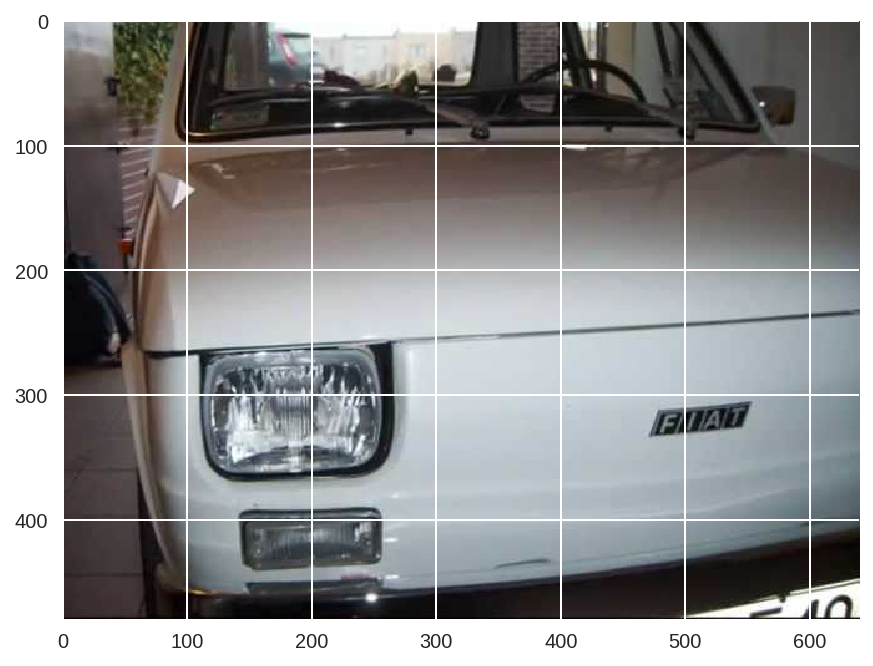

In [10]:
img = plt.imread(f'{PATH}valid/Fiat 126p Maluch/{files[9]}')
plt.imshow(img);

In [17]:
img.shape

(480, 640, 3)

In [18]:
img[50:51,150:152]

array([[[66, 62, 59],
        [66, 62, 59]]], dtype=uint8)

## Training

In [0]:
arch=resnet34
tfms = tfms_from_model(arch, sz)
data = ImageClassifierData.from_paths(PATH, tfms=tfms)

In [13]:
learn = ConvLearner.pretrained(arch, data, precompute=True)
learn.fit(0.01, 3)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /content/.torch/models/resnet34-333f7ec4.pth
100%|██████████| 87306240/87306240 [00:02<00:00, 31538991.03it/s]


100%|██████████| 16/16 [00:21<00:00,  1.33s/it]


Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.716546   0.425552   0.871429  
    1      0.484031   0.372782   0.885714  
    2      0.404039   0.326471   0.90102   



[array([0.32647]), 0.9010204079199811]

In [14]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.3664     0.313145   0.907143  
    1      0.345393   0.278481   0.919388  
    2      0.3213     0.277529   0.92551   



[array([0.27753]), 0.9255102038383484]

In [15]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.271799   0.25262    0.921429  
    1      0.261047   0.217703   0.922449  
    2      0.246425   0.265402   0.933673  



[array([0.2654]), 0.9336734693877551]

In [16]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.231899   0.222896   0.932653  
    1      0.230519   0.204629   0.936735  
    2      0.21353    0.254178   0.934694  



[array([0.25418]), 0.9346938775510204]

In [17]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.1982     0.210983   0.942857  
    1      0.196582   0.217034   0.944898  
    2      0.227693   0.218643   0.939796  



[array([0.21864]), 0.939795918367347]

In [18]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.194061   0.200763   0.944898  
    1      0.182207   0.26058    0.936735  
    2      0.189164   0.22927    0.937755  



[array([0.22927]), 0.9377551017975321]

In [19]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.172356   0.271144   0.937755  
    1      0.173193   0.266671   0.934694  
    2      0.166874   0.189425   0.945918  



[array([0.18943]), 0.9459183673469388]

In [20]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.158353   0.22411    0.95102   
    1      0.146167   0.248248   0.946939  
    2      0.156782   0.227581   0.95      



[array([0.22758]), 0.95]

In [21]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.178129   0.19232    0.942857  
    1      0.145337   0.18664    0.946939  
    2      0.140263   0.196272   0.95      



[array([0.19627]), 0.95]

In [22]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.149937   0.190522   0.945918  
    1      0.137396   0.217602   0.947959  
    2      0.129883   0.276724   0.939796  



[array([0.27672]), 0.939795918367347]

In [23]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.140857   0.255012   0.940816  
    1      0.14885    0.209136   0.944898  
    2      0.115438   0.181486   0.946939  



[array([0.18149]), 0.9469387755102041]

In [24]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.12771    0.189741   0.947959  
    1      0.137587   0.204285   0.946939  
    2      0.12121    0.170467   0.947959  



[array([0.17047]), 0.9479591836734694]

In [25]:
learn.fit(0.01, 3)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.093134   0.182208   0.947959  
    1      0.112738   0.196867   0.947959  
    2      0.146216   0.215894   0.945918  



[array([0.21589]), 0.9459183673469388]

## Analyzing results: looking at pictures

In [21]:
# This is the label for a val data
len(data.val_y)

980

In [22]:
data.val_y[0:200]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2])

In [23]:
img=data.val_ds.get_x(200)
img.shape

(320, 480, 3)

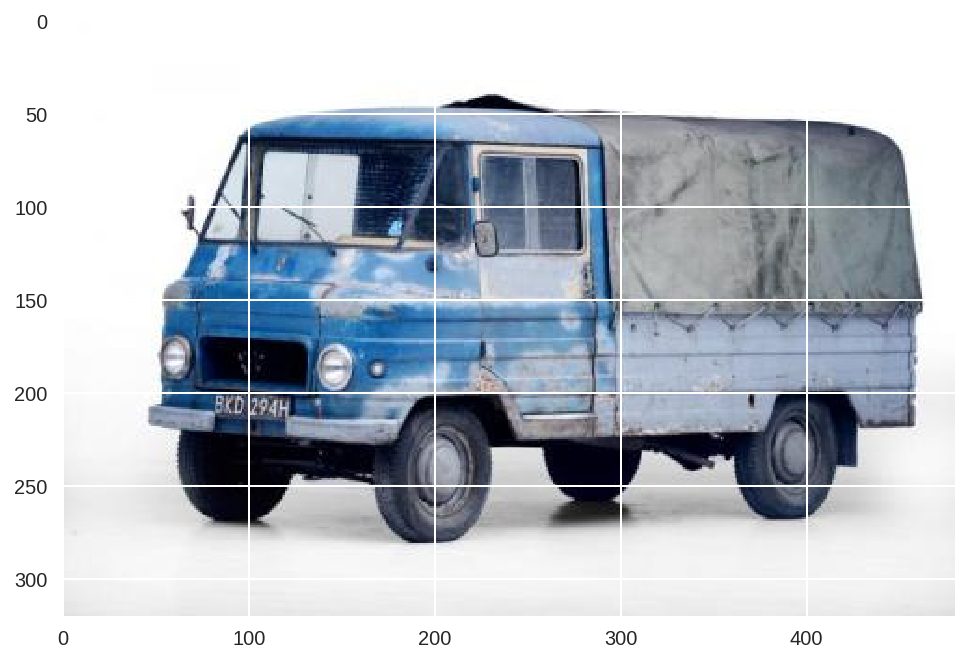

In [24]:
plt.imshow(img);

In [25]:
data.classes[data.val_ds.get_y(200)]

'FSC Zuk'

In [26]:
data.val_dl.dataset.get_x      

<bound method FilesDataset.get_x of <fastai.dataset.FilesIndexArrayDataset object at 0x7f7ceca47940>>

In [27]:
# from here we know that 'cats' is label 0 and 'dogs' is label 1.
data.classes

['Autobus Jelcz MZK',
 'Autobus Jelcz Ogorek',
 'FSC Zuk',
 'FSO Polonez',
 'FSO Warszawa',
 'Fiat 125p',
 'Fiat 126p Maluch',
 'Gazik',
 'Syrena 105',
 'ZSD Nysa']

In [28]:
# this gives prediction for validation set. Predictions are in log scale
log_preds = learn.predict()
log_preds.shape

(980, 10)

In [29]:
np.exp(log_preds[:2])

array([[0.9861 , 0.01373, 0.00013, 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.00004],
       [0.99905, 0.00093, 0.00002, 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ]],
      dtype=float32)

In [30]:
preds = np.argmax(log_preds, axis=1)  # from log probabilities to 0 or 1
probs = np.exp(log_preds[:,1])        # pr(dog)
print('preds: ', len(preds), preds[0:100], '\nprobs: ', len(probs), probs[0:20])

preds:  980 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 3
 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1] 
probs:  980 [0.01373 0.00093 0.00064 0.00243 0.00074 0.00028 0.00306 0.01108 0.00523 0.00243 0.00074 0.04138 0.00066
 0.00258 0.0035  0.19524 0.00026 0.00211 0.00267 0.19708]


In [0]:
def rand_by_mask(mask): return np.random.choice(np.where(mask)[0], 4, replace=False)
def rand_by_correct(is_correct): return rand_by_mask((preds == data.val_y)==is_correct)

In [0]:
def plot_val_with_title(idxs, title):
    imgs = np.stack([data.val_ds[x][0] for x in idxs])
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(data.val_ds.denorm(imgs), rows=1, titles=title_probs)

In [0]:
def plots(ims, figsize=(12,6), rows=1, titles=None):
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        sp = f.add_subplot(rows, len(ims)//rows, i+1)
        sp.axis('Off')
        if titles is not None: sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i])

In [0]:
def load_img_id(ds, idx): return np.array(PIL.Image.open(PATH+ds.fnames[idx]))

def plot_val_with_title(idxs, title):
    imgs = [load_img_id(data.val_ds,x) for x in idxs]
    title_probs = [str(probs[x]) + " " + Path(data.val_ds.fnames[x]).stem for x in idxs]
    print(title)
    return plots(imgs, rows=1, titles=title_probs, figsize=(16,8))

In [35]:
rand_by_correct(False)

array([386, 882, 388, 975])

In [36]:
len(data.val_ds.fnames)

980

In [37]:
data.val_ds.fnames[100]

'valid/Autobus Jelcz Ogorek/jelcz.ogorek.000422.jpg'

Correctly classified


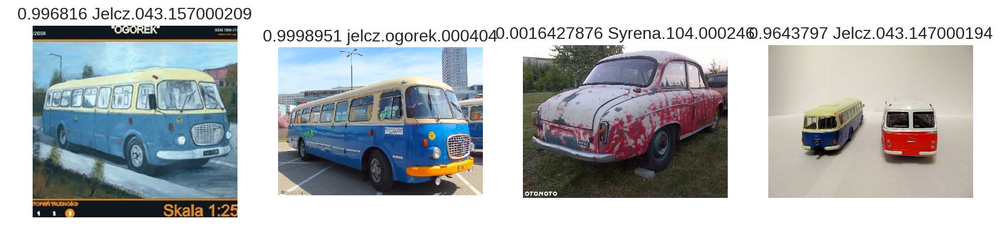

In [38]:
# 1. A few correct labels at random
plot_val_with_title(rand_by_correct(True), "Correctly classified")

Incorrectly classified


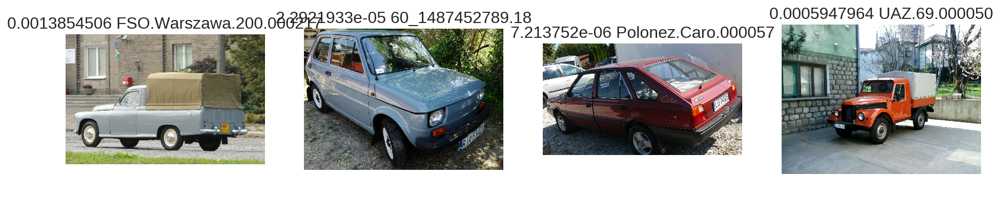

In [39]:
# 2. A few incorrect labels at random
plot_val_with_title(rand_by_correct(False), "Incorrectly classified")

In [0]:
def most_by_mask(mask, mult):
    idxs = np.where(mask)[0]
    return idxs[np.argsort(mult * probs[idxs])[:4]]

def most_by_correct(y, is_correct): 
    mult = -1 if (y==1)==is_correct else 1
    return most_by_mask((preds == data.val_y)==is_correct & (data.val_y == y), mult)

Most correct Autobus Jelcz MZK


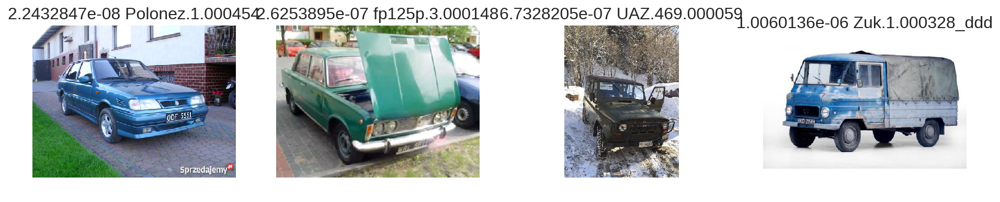

In [41]:
plot_val_with_title(most_by_correct(0, True), "Most correct " + data.classes[0])

In [0]:
# for class_idx, class_name in enumerate(data.classes):
#     plot_val_with_title(most_by_correct(class_idx, True), 'Most correct "' + data.classes[class_idx] + '"')

Most correct 1


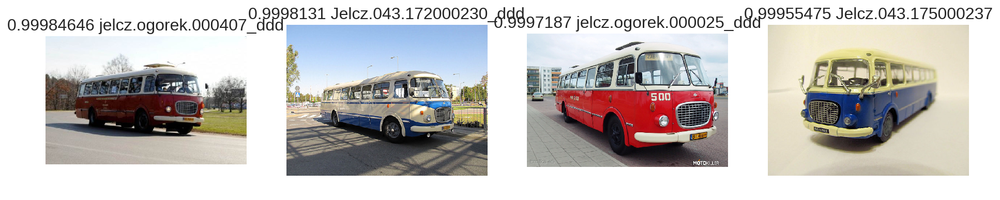

In [39]:
plot_val_with_title(most_by_correct(1, True), "Most correct 1")

Most correct 2


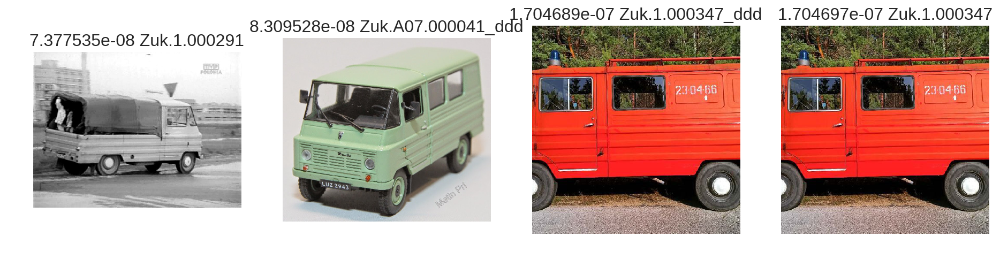

In [40]:
plot_val_with_title(most_by_correct(2, True), "Most correct 2")

Most correct 3


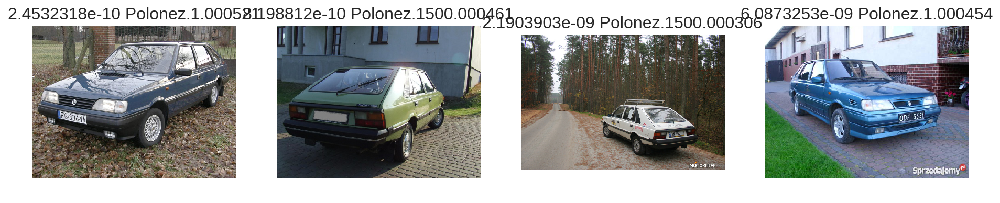

In [41]:
plot_val_with_title(most_by_correct(3, True), "Most correct 3")

Most incorrect 0


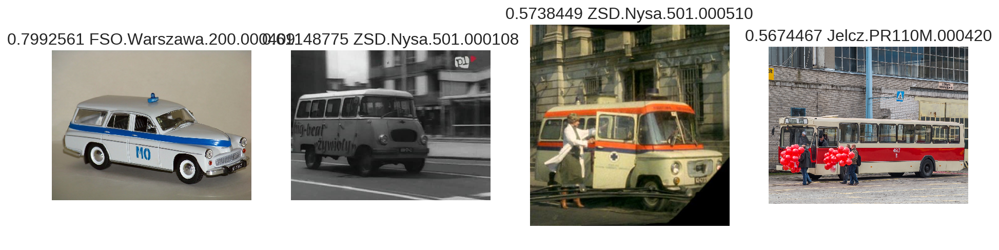

In [42]:
plot_val_with_title(most_by_correct(0, False), "Most incorrect 0")

Most incorrect 1


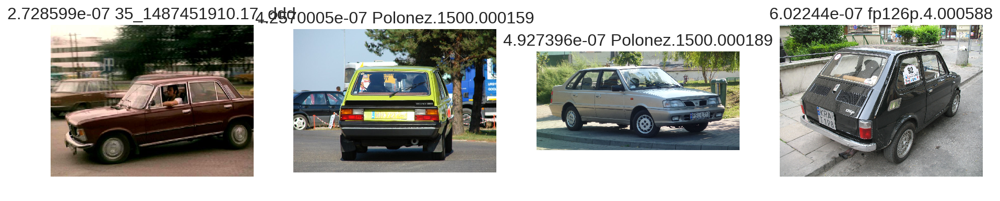

In [43]:
plot_val_with_title(most_by_correct(1, False), "Most incorrect 1")

Most incorrect 2


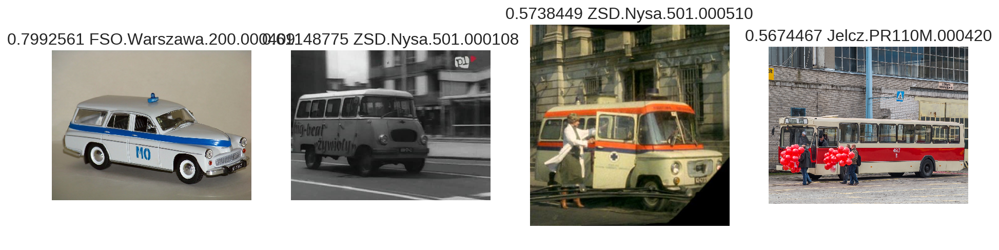

In [44]:
plot_val_with_title(most_by_correct(2, False), "Most incorrect 2")

Most uncertain predictions


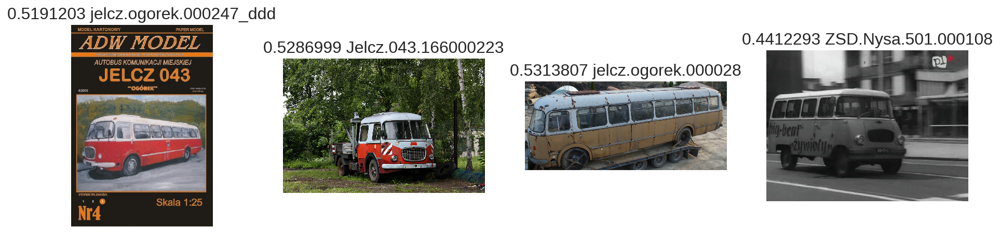

In [42]:
most_uncertain = np.argsort(np.abs(probs -0.5))[:4]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

## Choosing a learning rate

In [0]:
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [44]:
lrf=learn.lr_find()

Widget Javascript not detected.  It may not be installed or enabled properly.


 88%|████████▊ | 122/138 [00:03<00:00, 36.53it/s, loss=8.31]


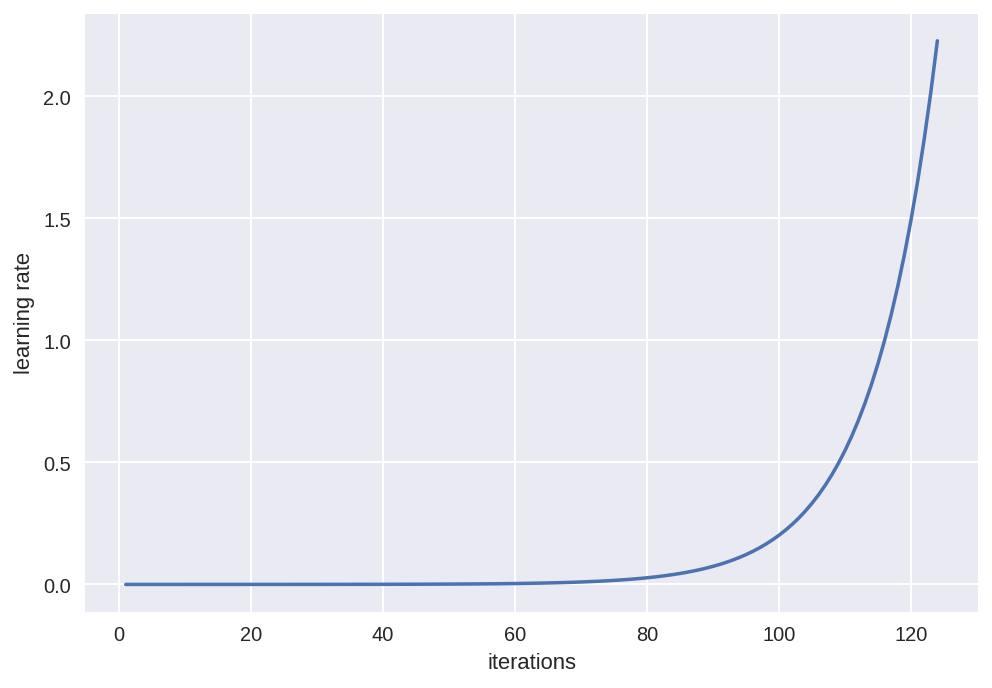

In [45]:
learn.sched.plot_lr()

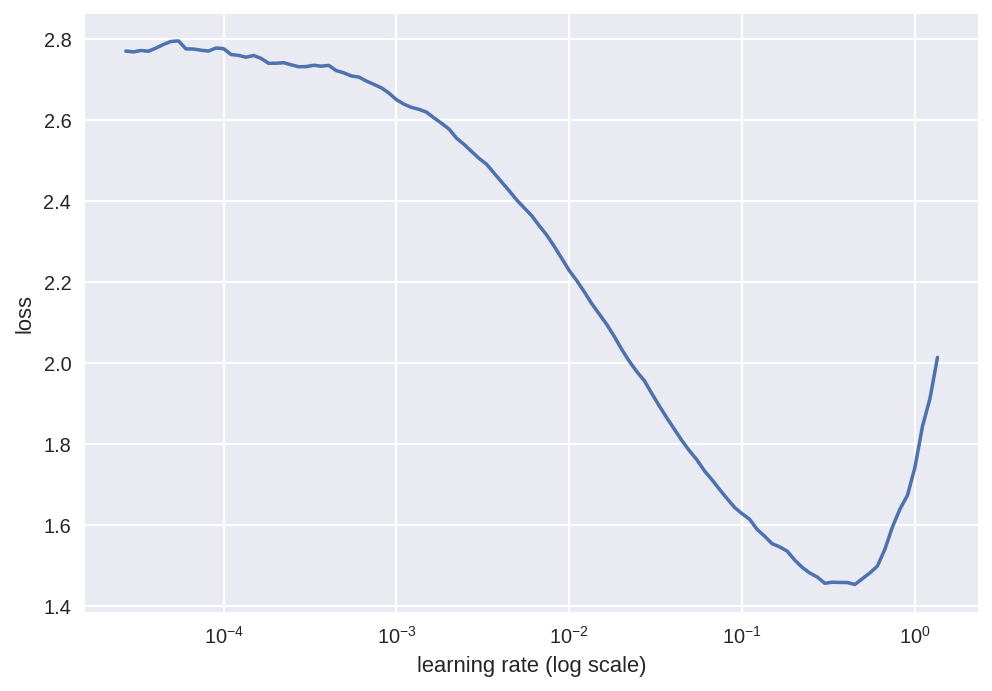

In [46]:
learn.sched.plot()

## Analyzing results

### Confusion matrix 

In [0]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(data.val_y, preds)

In [48]:
learn.predict()

array([[-3.19504, -3.69481, -0.9776 , ..., -5.32886, -1.55594, -6.45716],
       [-3.24068, -4.71482, -0.62271, ..., -6.12832, -2.84271, -7.22038],
       [-3.1344 , -3.93869, -0.91535, ..., -5.97289, -3.20503, -6.721  ],
       ...,
       [-3.97696, -4.46545, -1.02408, ..., -5.51428, -3.96412, -6.8132 ],
       [-3.98977, -3.79921, -0.25575, ..., -7.00211, -3.37077, -7.21493],
       [-3.42938, -3.5811 , -0.41454, ..., -5.46488, -3.49882, -6.38346]], dtype=float32)

[[93  4  0  1  0  0  0  0  0  0]
 [ 5 88  0  0  1  2  0  0  0  2]
 [ 0  2 92  1  0  0  0  0  0  3]
 [ 0  0  0 74  0  9 14  0  1  0]
 [ 1  1  1  2 87  1  2  0  3  0]
 [ 1  0  0  2  5 82  5  1  2  0]
 [ 0  0  1  6  2  5 84  0  0  0]
 [ 0  0  0  1  0  1  0 94  1  1]
 [ 0  0  0  1  9  4  2  0 82  0]
 [ 3  4  4  0  0  2  0  0  1 84]]


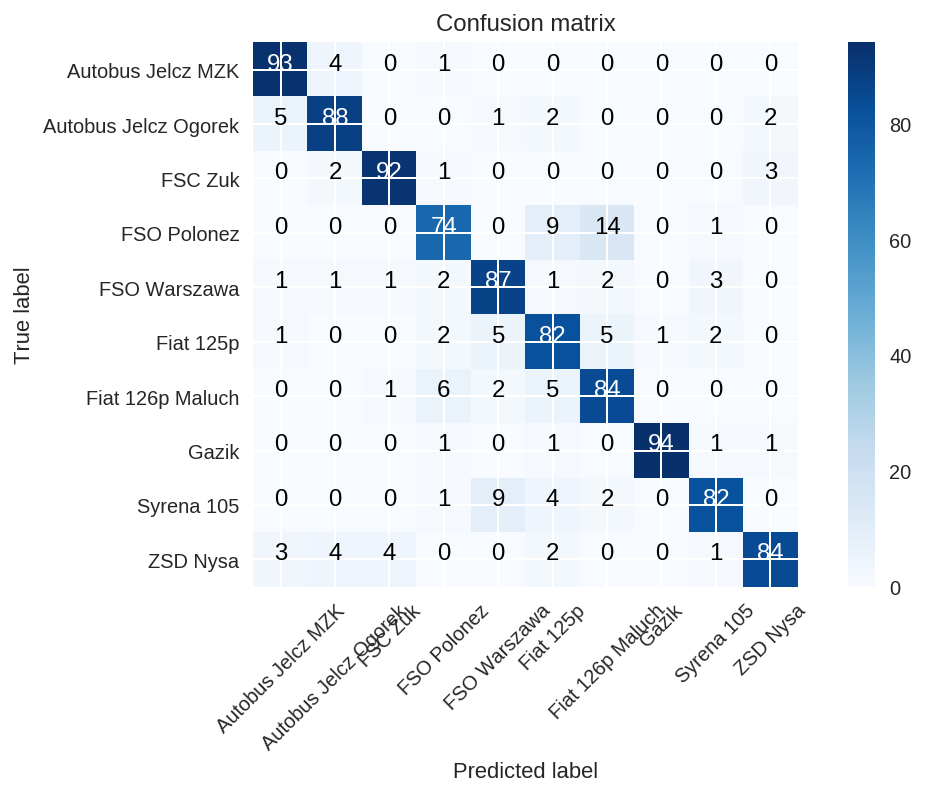

In [49]:
%config InlineBackend.figure_format = 'retina'
plot_confusion_matrix(cm, data.classes)

for three classes
* accuracy 0.91027
* 424
* (136+104+145)/424

In [53]:
(136+104+145)/424

0.9080188679245284

for 10 classes, 4 epochs
* accuracy: 0.8282
* val size: 997

## Inference

In [0]:
def inference(learn, fname):
    learn.precompute=False 
    trn_tfms, val_tfms = tfms_from_model(arch, sz)
    im = val_tfms(PIL.Image.open(fname))
    preds = learn.predict_array(im[None])
    pred_class_idx=np.argmax(preds)
    return pred_class_idx, data.classes[pred_class_idx]

In [77]:
files = !ls {PATH}valid/Autobus\ Jelcz\ MZK | head -n 1000
# files = !ls {PATH}test1 | head -n 1000
print(files)
file = files[0]
print(file)

path = f'%svalid/Autobus Jelcz MZK/%s' % (PATH, file)
# path = f'%stest1/%s' % (PATH, file)
print(path)

fname = path

learn.precompute=False 
trn_tfms, val_tfms = tfms_from_model(arch, sz)
im = val_tfms(np.array(PIL.Image.open(fname)))
preds = learn.predict_array(im[None])
print(np.exp(preds))
print(np.argmax(preds))
pred_class_idx=np.argmax(preds)
print(data.classes[pred_class_idx])

['Autobus.Jelcz.33_1487455266.66_ddd.jpg', 'Autobus.Jelcz.48_1487455309.35_ddd.jpg', 'Autobus.Jelcz.70_1487455346.74.jpg', 'Autobus.Jelcz.90_1487455377.41.jpg', 'Berliet.PR100.000005.jpg', 'Berliet.PR100.000007.jpg', 'Berliet.PR100.000015.jpg', 'Berliet.PR100.000025.jpg', 'Berliet.PR100.000028.jpg', 'Berliet.PR100.000059_ddd.jpg', 'Berliet.PR100.000065_ddd.jpg', 'Berliet.PR100.000095_ddd.jpg', 'Berliet.PR100.000099_ddd.jpg', 'Berliet.PR100.000107.jpg', 'Berliet.PR100.000129.jpg', 'Berliet.PR100.000161.jpg', 'Berliet.PR100.000170.jpg', 'Berliet.PR100.000175_ddd.jpg', 'Berliet.PR100.000179.jpg', 'Berliet.PR100.000185.jpg', 'Berliet.PR100.000231.jpg', 'Berliet.PR100.000236.jpg', 'Berliet.PR100.000253.jpg', 'Berliet.PR100.000265_ddd.jpg', 'Berliet.PR100.000265.jpg', 'Berliet.PR100.000273.jpg', 'Berliet.PR100.000292_ddd.jpg', 'Berliet.PR100.000297_ddd.jpg', 'Berliet.PR100.000302.jpg', 'Berliet.PR100.000308.jpg', 'Berliet.PR100.000326.jpg', 'Berliet.PR100.000331_ddd.jpg', 'Berliet.PR100.0003

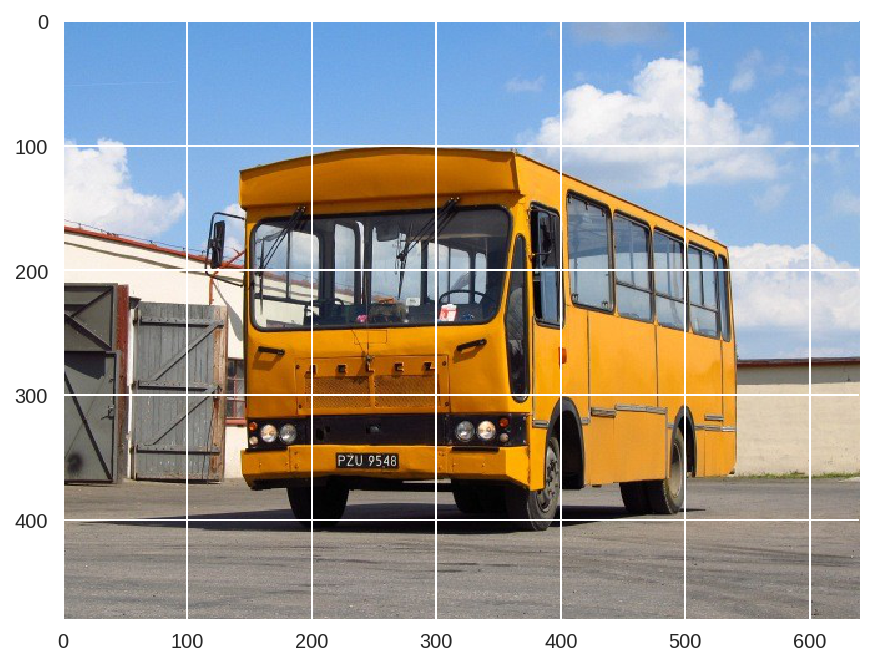

In [78]:
img = plt.imread(path)
plt.imshow(img);

In [0]:
files = !ls {PATH}test1 | head -n 1000

file = files[55]
print(file)

path = f'%stest1/%s' % (PATH, file)
print(path)
print(inference(learn, path))
img = plt.imread(path)
plt.imshow(img);

In [0]:
def inference2(path):
    trn_tfms, val_tfrms = tfms_from_model(arch, sz)
    im = val_tfrms(Image.open(path))

    log_probs = to_np(learn.models.model(V(T(im[None]).cuda())))
    preds = np.argmax(log_probs, axis=1)
    return preds

In [0]:
for file in files:
    path = f'%stest1/%s' % (PATH, file)
    pred = inference2(path)
    print(pred, file)
    

In [0]:
trn_tfms, val_tfrms = tfms_from_model(arch, sz)

def inference3(image_path):
    # fname is Path()
    ds = FilesIndexArrayDataset([image_path.name], np.array([0]), val_tfms, image_path.parent)
    dl = DataLoader(ds)
    preds = learn.predict_dl(dl)[0]
    probs = np.exp(preds)
    pred = np.argmax(preds)
    class_name = data.classes[pred]
    prob = probs[pred]
    return pred, class_name, prob

In [0]:
PATH2 = Path(f'{PATH}test1')
print(PATH2)
file_paths = sorted(PATH2.glob('*.jpg'))
file_path=file_paths[400]
# file = Path(file1).name
print(file1)
# image_path = PATH2 / file
# print(image_path)

for file_path in file_paths:
    (pred, class_name, prob) = inference3(file_path)
    print('%s\t%s\t%s\t%s' % (pred, class_name, prob, file_path.name))

In [0]:
PATH2 = f'{PATH}test1'
print(PATH2)
files = !ls {PATH2} | head -n 1000
file1=files[400]
file = Path(file1).name
print(file)
fn = f'%stest1/%s' % (PATH, file)
print(fn)
trn_tfms, val_tfrms = tfms_from_model(arch, sz)
ds = FilesIndexArrayDataset([Path(file1).name], np.array([0]), val_tfms, PATH2)
dl = DataLoader(ds)
preds = learn.predict_dl(dl)
print(np.argmax(preds))
print(data.classes[np.argmax(preds)])

## Improving our model

In [0]:
tfms = tfms_from_model(resnet34, sz, aug_tfms=transforms_side_on, max_zoom=1.1)

In [0]:
def get_augs():
    data = ImageClassifierData.from_paths(PATH, bs=2, tfms=tfms, num_workers=1)
    x,_ = next(iter(data.aug_dl))
    return data.trn_ds.denorm(x)[1]

In [0]:
ims = np.stack([get_augs() for i in range(6)])

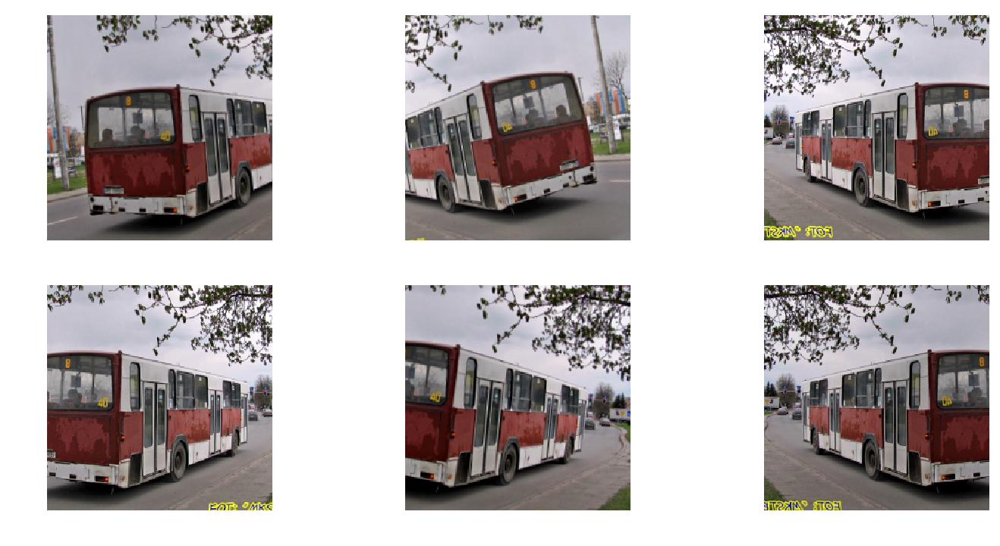

In [57]:
plots(ims, rows=2)

In [0]:
data = ImageClassifierData.from_paths(PATH, tfms=tfms)
learn = ConvLearner.pretrained(arch, data, precompute=False)

In [59]:
learn.fit(1e-2, 2)

Widget Javascript not detected.  It may not be installed or enabled properly.


epoch      trn_loss   val_loss   accuracy   
    0      0.764569   0.440171   0.840816  
    1      0.57684    0.360166   0.87551   



[array([0.36017]), 0.8755102045682012]

In [60]:
# this gives prediction for validation set. Predictions are in log scale
log_preds = learn.predict()
log_preds.shape

(980, 10)

In [61]:
preds = np.argmax(log_preds, axis=1)  # from log probabilities to 0 or 1
probs = np.exp(log_preds[:,1])        # pr(dog)
print('preds: ', len(preds), preds[0:20], '\nprobs: ', len(probs), probs[0:20])

preds:  980 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0] 
probs:  980 [0.00698 0.00079 0.00153 0.02081 0.00024 0.00069 0.03011 0.00761 0.01318 0.00029 0.0067  0.01412 0.01789
 0.00236 0.00078 0.0001  0.06018 0.00174 0.04611 0.01785]


In [0]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(data.val_y, preds)

[[95  3  0  0  0  0  0  0  0  0]
 [ 7 86  1  0  0  2  0  0  0  2]
 [ 0  0 93  0  0  0  0  0  0  5]
 [ 0  0  0 84  0  5  6  1  1  1]
 [ 0  0  0  1 87  0  3  1  5  1]
 [ 0  1  0  7 10 74  3  1  1  1]
 [ 0  0  0  7  1  3 84  1  1  1]
 [ 0  0  0  1  0  0  1 94  1  1]
 [ 0  0  0  0 15  3  2  0 78  0]
 [ 2  6  4  0  1  1  0  0  1 83]]


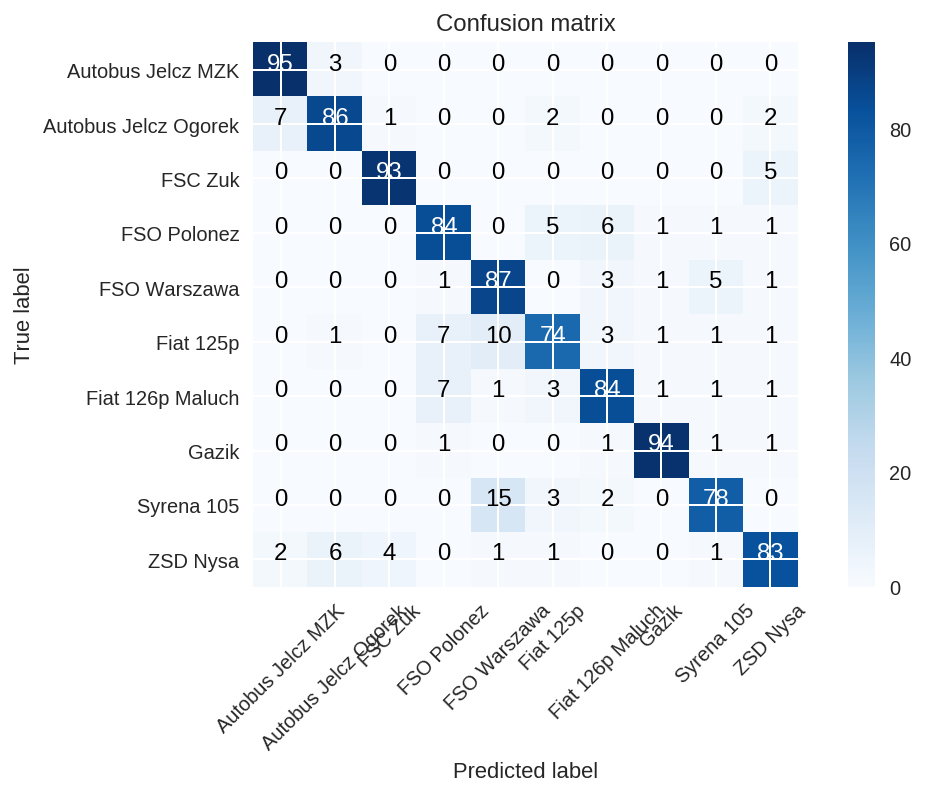

In [63]:
plot_confusion_matrix(cm, data.classes)

In [64]:
bad_predicted_fnames = []
bad_predicted_idxs = []
bad_predicted_classes = []
# plot table of train or val preds
# idx, image name, correct category, actual category
for idx in range(len(preds)):
    correct_class_idx = data.val_y[idx]
    predicted_class_idx = preds[idx]
    fname = data.val_ds.fnames[idx]
    predicted_class = data.classes[predicted_class_idx]
    if correct_class_idx != predicted_class_idx:
        bad_predicted_fnames.append(fname)
        bad_predicted_idxs.append(idx)
        bad_predicted_classes.append(predicted_class)
        # print(idx, correct_class_idx, predicted_class_idx, probs[idx], data.val_ds.fnames[idx], ',', data.classes[predicted_class_idx])
        print('%s\t%s\t%s\t%s\t%s\t%s' % (idx, correct_class_idx, predicted_class_idx, probs[idx], fname, predicted_class))

42	0	1	0.52892077	valid/Autobus Jelcz MZK/Berliet.PR100.000236.jpg	Autobus Jelcz Ogorek
73	0	1	0.5664851	valid/Autobus Jelcz MZK/Jelcz.PR110M.000420.jpg	Autobus Jelcz Ogorek
74	0	1	0.5199782	valid/Autobus Jelcz MZK/Jelcz.PR110M.000478.jpg	Autobus Jelcz Ogorek
109	1	0	0.39208752	valid/Autobus Jelcz Ogorek/Jelcz.043.315000404_ddd.jpg	Autobus Jelcz MZK
110	1	0	0.28662613	valid/Autobus Jelcz Ogorek/Jelcz.043.335000427.jpg	Autobus Jelcz MZK
125	1	0	0.21091478	valid/Autobus Jelcz Ogorek/Jelcz.044.0000119.jpg	Autobus Jelcz MZK
126	1	9	0.0132325245	valid/Autobus Jelcz Ogorek/Jelcz.043.195000259.jpg	ZSD Nysa
134	1	5	0.17422856	valid/Autobus Jelcz Ogorek/jelcz.ogorek.000422.jpg	Fiat 125p
142	1	2	0.20222037	valid/Autobus Jelcz Ogorek/jelcz.ogorek.000092.jpg	FSC Zuk
148	1	0	0.29425597	valid/Autobus Jelcz Ogorek/Jelcz.043.368000463.jpg	Autobus Jelcz MZK
167	1	0	0.072036326	valid/Autobus Jelcz Ogorek/Jelcz.043.257000334.jpg	Autobus Jelcz MZK
170	1	0	0.08651175	valid/Autobus Jelcz Ogorek/jelcz.ogorek

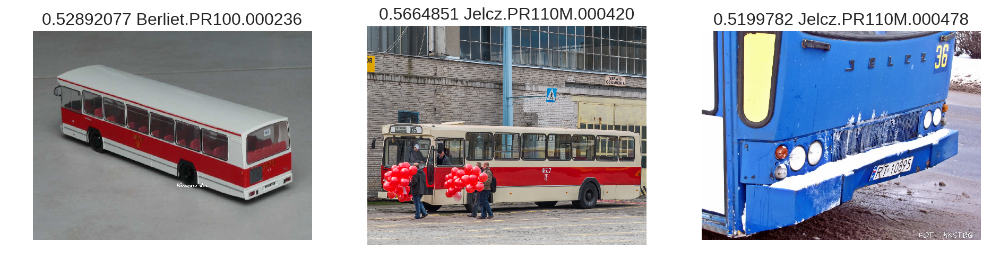

In [65]:
#plot bad images
# bad_predicted_idxs
plot_val_with_title(bad_predicted_idxs[0:3], "")

In [66]:
# copy bad predicted images:
for idx, fname in enumerate(bad_predicted_fnames):
    img_path = PATH + fname
    # print(img_path)
    fname = bad_predicted_classes[idx] + ', ' + Path(fname).name
    dest_path = Path(PATH) / "bad_predicted_images" / fname
    print(dest_path)
    sh.copy2(img_path, dest_path)

data/old_polish_cars/old_polish_cars_v5_photos-split/bad_predicted_images/Autobus Jelcz Ogorek, Berliet.PR100.000236.jpg


FileNotFoundError: ignored